# VAE con Caras — Continuación del Notebook MNIST

Continuamos explorando los **Variational Autoencoders (VAE)** usando un dataset de caras reales.

Trabajar con caras en lugar de dígitos MNIST ofrece varias ventajas pedagógicas:
- Las imágenes tienen mucha más variabilidad y riqueza visual
- La **borrosidad** en las reconstrucciones se hace más evidente e interesante
- El espacio latente captura atributos semánticos reales (pose, expresión, iluminación)
- Las aplicaciones prácticas son inmediatas (denoising, detección de anomalías, interpolación)

## Dataset

Usamos **LFW** (Labeled Faces in the Wild) como dataset principal (disponible directamente
en torchvision, ~200 MB), con soporte opcional para **CelebA** si está descargado localmente.

## Estructura del notebook

| Sección | Tema |
|---------|------|
| A | Reconstrucción — ¿qué preserva y qué pierde el VAE? |
| B | Experimento de dimensión latente — $z \in \mathbb{R}^2, \mathbb{R}^8, \mathbb{R}^{32}, \mathbb{R}^{128}$ |
| C | Interpolación en el espacio latente |
| D | Autoencoder de denoising |
| E | Detección de anomalías |


## 0. Imports y configuración

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, Subset, random_split
from torchvision import datasets, transforms
from torchvision.utils import make_grid

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import roc_auc_score


torch.manual_seed(42)
np.random.seed(42)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {DEVICE}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

# Modo rapido para pruebas (reduce epocas y datos)
QUICK_MODE = False   # <- pone True para probar rapido


Usando dispositivo: cuda
GPU: NVIDIA RTX A5000


## 1. Dataset: LFW (Labeled Faces in the Wild)

Usamos el dataset **LFW** descargado desde Kaggle. Si todavía no lo tenés, ejecutá en una terminal:

```bash
curl -L -o ~/Downloads/lfw-dataset.zip \
  https://www.kaggle.com/api/v1/datasets/download/jessicali9530/lfw-dataset
```

Luego descomprimilo en la carpeta de datos del curso:

```bash
unzip ~/Downloads/lfw-dataset.zip -d ../data/lfw-dataset/
```

La estructura esperada es:

```
../data/lfw-dataset/
  lfw-deepfunneled/
    lfw-deepfunneled/
      Aaron_Eckhart/
        Aaron_Eckhart_0001.jpg
      Abdul_Rahman/
        ...
```

> **Nota:** Para usar la API de Kaggle necesitás tener tu `kaggle.json` configurado en `~/.kaggle/`.
> Podés descargarlo desde [kaggle.com/account](https://www.kaggle.com/account) → *API* → *Create New Token*.


In [11]:
IMAGE_SIZE = 64
BATCH_SIZE = 128

def denormalize(x):
    # Desnormaliza de [-1, 1] a [0, 1]
    return (x * 0.5 + 0.5).clamp(0, 1)

transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# Path al dataset LFW descargado de Kaggle
LFW_DIR = "../data/lfw-dataset/lfw-deepfunneled/lfw-deepfunneled"

full_dataset = datasets.ImageFolder(root=LFW_DIR, transform=transform)

n_train = int(0.8 * len(full_dataset))
n_val   = len(full_dataset) - n_train
train_dataset, val_dataset = random_split(
    full_dataset, [n_train, n_val],
    generator=torch.Generator().manual_seed(42))

DATASET_NAME = "LFW"
HAS_ATTRS    = False

print(f"Dataset:           {DATASET_NAME}")
print(f"Personas (clases): {len(full_dataset.classes):,}")
print(f"Total imagenes:    {len(full_dataset):,}")
print(f"Train: {len(train_dataset):,}  |  Val: {len(val_dataset):,}")

# Guardar referencias sin QUICK_MODE para la seccion de anomaly detection
train_dataset_full = train_dataset
val_dataset_full   = val_dataset

if QUICK_MODE:
    train_dataset = Subset(train_dataset, range(min(5_000, len(train_dataset))))
    val_dataset   = Subset(val_dataset,   range(min(1_000, len(val_dataset))))

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=4, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=4, pin_memory=True)


Dataset:           LFW
Personas (clases): 5,749
Total imagenes:    13,233
Train: 10,586  |  Val: 2,647


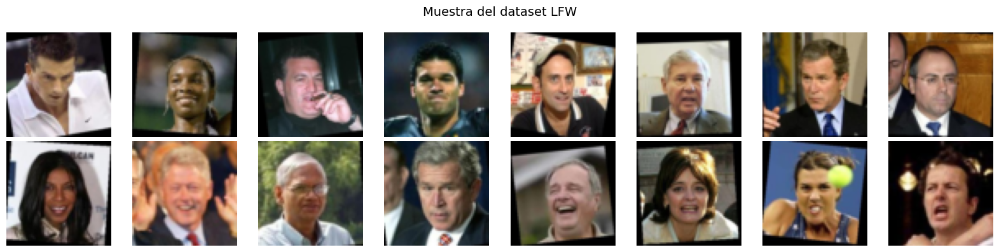

Forma de cada imagen: (3, 64, 64)  ->  64x64 RGB


In [12]:
# Visualizar imagenes de muestra
x_sample, _ = next(iter(val_loader))
x_sample = x_sample[:16]

fig, axes = plt.subplots(2, 8, figsize=(16, 4))
for i, ax in enumerate(axes.flat):
    img = denormalize(x_sample[i]).permute(1, 2, 0).numpy()
    ax.imshow(img)
    ax.axis("off")
plt.suptitle(f"Muestra del dataset {DATASET_NAME}", fontsize=14)
plt.tight_layout()
plt.show()
print(f"Forma de cada imagen: {tuple(x_sample.shape[1:])}  ->  {IMAGE_SIZE}x{IMAGE_SIZE} RGB")


## 2. Arquitectura: VAE Convolucional

Para imágenes de caras RGB usamos una arquitectura **convolucional** más adecuada
que la red fully-connected del notebook MNIST.

```
Encoder (64x64x3 → z ∈ R^d)                    Decoder (z ∈ R^d → 64x64x3)
──────────────────────────────                  ────────────────────────────────
Conv(3→ 32, k=4, s=2) → 32x32                  Linear(d → 4096)
Conv(32→ 64, k=4, s=2) → 16x16                 ConvT(256→128, k=4, s=2) →  8x8
Conv(64→128, k=4, s=2) →  8x8                  ConvT(128→ 64, k=4, s=2) → 16x16
Conv(128→256, k=4, s=2) →  4x4                 ConvT( 64→ 32, k=4, s=2) → 32x32
Flatten → 4096                                  ConvT( 32→  3, k=4, s=2) → 64x64
Linear → mu ∈ R^d,  log_var ∈ R^d              Tanh  (salida en [-1, 1])
```


In [13]:
class ConvVAE(nn.Module):
    """VAE Convolucional para imagenes RGB de tamanio IMAGE_SIZE x IMAGE_SIZE."""

    def __init__(self, latent_dim: int, img_channels: int = 3, img_size: int = 64):
        super().__init__()
        self.latent_dim   = latent_dim
        self.img_channels = img_channels
        self.feature_size = img_size // 16          # 64 // 16 = 4
        self.hidden_dim   = 256 * self.feature_size ** 2   # 4096

        # Encoder
        self.encoder_conv = nn.Sequential(
            nn.Conv2d(img_channels,  32, 4, stride=2, padding=1), nn.BatchNorm2d( 32), nn.LeakyReLU(0.2),
            nn.Conv2d( 32,  64, 4, stride=2, padding=1), nn.BatchNorm2d( 64), nn.LeakyReLU(0.2),
            nn.Conv2d( 64, 128, 4, stride=2, padding=1), nn.BatchNorm2d(128), nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 4, stride=2, padding=1), nn.BatchNorm2d(256), nn.LeakyReLU(0.2),
        )
        self.fc_mu     = nn.Linear(self.hidden_dim, latent_dim)
        self.fc_logvar = nn.Linear(self.hidden_dim, latent_dim)

        # Decoder
        self.fc_decode    = nn.Linear(latent_dim, self.hidden_dim)
        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), nn.BatchNorm2d(128), nn.ReLU(),
            nn.ConvTranspose2d(128,  64, 4, stride=2, padding=1), nn.BatchNorm2d( 64), nn.ReLU(),
            nn.ConvTranspose2d( 64,  32, 4, stride=2, padding=1), nn.BatchNorm2d( 32), nn.ReLU(),
            nn.ConvTranspose2d( 32, img_channels, 4, stride=2, padding=1), nn.Tanh(),
        )

    def encode(self, x):
        h = self.encoder_conv(x).view(-1, self.hidden_dim)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, log_var):
        """Truco de reparametrizacion: z = mu + sigma * eps,  eps ~ N(0, I)."""
        if self.training:
            std = torch.exp(0.5 * log_var)
            eps = torch.randn_like(std)
            return mu + std * eps
        return mu   # en inferencia usamos la media directamente

    def decode(self, z):
        h = self.fc_decode(z).view(-1, 256, self.feature_size, self.feature_size)
        return self.decoder_conv(h)

    def forward(self, x):
        mu, log_var = self.encode(x)
        z = self.reparameterize(mu, log_var)
        return self.decode(z), mu, log_var


# Verificacion rapida
_m = ConvVAE(latent_dim=128).to(DEVICE)
_x = torch.randn(4, 3, IMAGE_SIZE, IMAGE_SIZE).to(DEVICE)
_xhat, _mu, _lv = _m(_x)
print(f"Input:          {tuple(_x.shape)}")
print(f"mu / log_var:   {tuple(_mu.shape)}")
print(f"Reconstruccion: {tuple(_xhat.shape)}")
print(f"Parametros:     {sum(p.numel() for p in _m.parameters()):,}")
del _m, _x, _xhat, _mu, _lv


Input:          (4, 3, 64, 64)
mu / log_var:   (4, 128)
Reconstruccion: (4, 3, 64, 64)
Parametros:     2,958,659


## 3. Función de pérdida y utilidades de entrenamiento

In [14]:
def vae_loss(x_hat, x, mu, log_var, beta=1.0):
    """ELBO normalizada por batch. Retorna (loss_total, recon_loss, kl_loss)."""
    N = x.size(0)
    recon = F.mse_loss(x_hat, x, reduction="sum") / N
    kl    = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp()) / N
    return recon + beta * kl, recon, kl


def train_epoch(model, loader, optimizer, beta, device):
    model.train()
    totals = [0.0, 0.0, 0.0]
    for x, _ in loader:
        x = x.to(device)
        x_hat, mu, log_var = model(x)
        loss, recon, kl = vae_loss(x_hat, x, mu, log_var, beta)
        optimizer.zero_grad(); loss.backward(); optimizer.step()
        n = x.size(0)
        for i, v in enumerate([loss, recon, kl]):
            totals[i] += v.item() * n
    N = len(loader.dataset)
    return [t / N for t in totals]


@torch.no_grad()
def eval_epoch(model, loader, beta, device):
    model.eval()
    totals = [0.0, 0.0, 0.0]
    for x, _ in loader:
        x = x.to(device)
        x_hat, mu, log_var = model(x)
        loss, recon, kl = vae_loss(x_hat, x, mu, log_var, beta)
        n = x.size(0)
        for i, v in enumerate([loss, recon, kl]):
            totals[i] += v.item() * n
    N = len(loader.dataset)
    return [t / N for t in totals]


## 4. Entrenamiento del modelo principal

Entrenamos un VAE convolucional con `d = 128` y monitoreamos ambos términos
de la pérdida por separado.


In [15]:
LATENT_DIM = 128
LR         = 1e-3
BETA       = 1.0
NUM_EPOCHS = 5 if QUICK_MODE else 30

vae       = ConvVAE(latent_dim=LATENT_DIM).to(DEVICE)
optimizer = optim.Adam(vae.parameters(), lr=LR)

history = {k: [] for k in ["loss", "recon", "kl", "val_loss", "val_recon", "val_kl"]}

for epoch in range(1, NUM_EPOCHS + 1):
    tr = train_epoch(vae, train_loader, optimizer, BETA, DEVICE)
    vl = eval_epoch(vae, val_loader,   BETA, DEVICE)
    for k, v in zip(["loss", "recon", "kl"], tr):           history[k].append(v)
    for k, v in zip(["val_loss", "val_recon", "val_kl"], vl): history[k].append(v)

    if epoch % 5 == 0 or epoch == 1:
        print(f"Epoca {epoch:3d}/{NUM_EPOCHS}  "
              f"Loss: {tr[0]:.4f}  Recon: {tr[1]:.4f}  KL: {tr[2]:.4f}  "
              f"| Val Loss: {vl[0]:.4f}")

print("\nEntrenamiento completo.")


Epoca   1/30  Loss: 2203.8659  Recon: 2068.9752  KL: 134.8907  | Val Loss: 1369.0595
Epoca   5/30  Loss: 789.1153  Recon: 620.2618  KL: 168.8535  | Val Loss: 734.7624
Epoca  10/30  Loss: 654.5810  Recon: 481.1876  KL: 173.3934  | Val Loss: 630.4020
Epoca  15/30  Loss: 611.4322  Recon: 436.6363  KL: 174.7959  | Val Loss: 571.1204
Epoca  20/30  Loss: 588.9502  Recon: 413.6709  KL: 175.2793  | Val Loss: 540.2413
Epoca  25/30  Loss: 563.7738  Recon: 388.9446  KL: 174.8292  | Val Loss: 532.1478
Epoca  30/30  Loss: 555.8657  Recon: 380.9825  KL: 174.8832  | Val Loss: 534.4179

Entrenamiento completo.


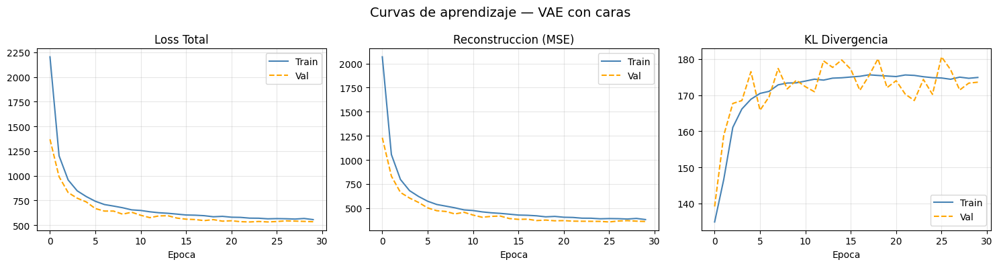

In [16]:
# Curvas de aprendizaje
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, (tr_k, vl_k), title in zip(
        axes,
        [("loss","val_loss"), ("recon","val_recon"), ("kl","val_kl")],
        ["Loss Total", "Reconstruccion (MSE)", "KL Divergencia"]):
    ax.plot(history[tr_k], label="Train", color="steelblue")
    ax.plot(history[vl_k], label="Val",   color="orange", linestyle="--")
    ax.set_title(title); ax.set_xlabel("Epoca"); ax.legend(); ax.grid(alpha=0.3)
plt.suptitle("Curvas de aprendizaje — VAE con caras", fontsize=14)
plt.tight_layout(); plt.show()


---
## Sección A — Reconstrucción

Comparamos las imágenes originales $x$ con sus reconstrucciones $\hat{x}$.

$$x \xrightarrow{\text{encoder}} (\mu,\, \log\sigma^2)
  \xrightarrow{\text{reparametrización}} z
  \xrightarrow{\text{decoder}} \hat{x}$$


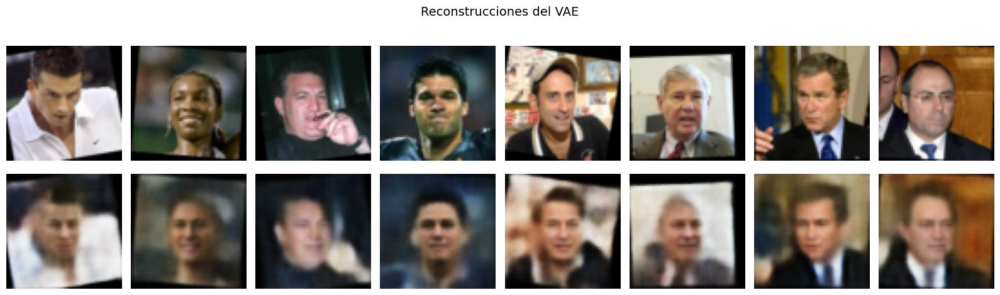

In [17]:
@torch.no_grad()
def show_reconstructions(model, loader, n=8, device=DEVICE):
    model.eval()
    x, _ = next(iter(loader))
    x = x[:n].to(device)
    x_hat, _, _ = model(x)

    fig, axes = plt.subplots(2, n, figsize=(2 * n, 5))
    for i in range(n):
        axes[0, i].imshow(denormalize(x[i].cpu()).permute(1, 2, 0).numpy())
        axes[1, i].imshow(denormalize(x_hat[i].cpu()).permute(1, 2, 0).numpy().clip(0, 1))
        axes[0, i].axis("off"); axes[1, i].axis("off")
    axes[0, 0].set_ylabel("Original  $x$",             fontsize=11)
    axes[1, 0].set_ylabel("Reconstruccion  $\\hat{x}$", fontsize=11)
    plt.suptitle("Reconstrucciones del VAE", fontsize=14)
    plt.tight_layout(); plt.show()

show_reconstructions(vae, val_loader, n=8)


### 🤔 Preguntas para reflexionar

1. **¿Las reconstrucciones son borrosas?** Compará la nitidez del original con la reconstrucción. ¿Qué lo causa?

2. **¿Qué detalles se preservan?** ¿La pose? ¿El color de pelo? ¿La iluminación general?

3. **¿Qué detalles se pierden?** ¿Los detalles finos como arrugas, textura de piel, joyería?

4. **¿El modelo preserva la identidad?** ¿La reconstrucción parece la misma persona o una cara "promedio"?

5. **¿Qué pasaría si la dimensión latente fuese muy pequeña?** ¿Más o menos borroso? ¿Por qué?

> **Pista:** La borrosidad es consecuencia del término de pérdida MSE y de la regularización KL.
> El MSE produce el *promedio* de todas las reconstrucciones plausibles dado $z$. El KL fuerza al
> espacio latente a ser suave y continuo, a expensas de la nitidez.
> Los modelos de difusión resuelven esto con un proceso iterativo de denoising.


---
## Sección B — Experimento de Dimensión Latente

Entrenamos cuatro VAEs con distintas dimensiones latentes y comparamos:

$$z \in \mathbb{R}^{2}, \quad z \in \mathbb{R}^{8}, \quad z \in \mathbb{R}^{32}, \quad z \in \mathbb{R}^{128}$$

| Métrica | Descripción |
|---------|-------------|
| MSE de reconstrucción | Calidad visual de $\hat{x}$ |
| Ratio de compresión | $\frac{64 \times 64 \times 3}{d}$ |
| Visualización latente | PCA a 2D del espacio latente |
| Calidad de interpolación | ¿La transición entre caras es suave? |


In [18]:
LATENT_DIMS   = [2, 8, 32, 128]
EPOCHS_LATENT = 3 if QUICK_MODE else 15
LR_LATENT     = 1e-3

latent_models    = {}
latent_histories = {}

for d in LATENT_DIMS:
    print(f"\n--- VAE  d={d} ---")
    model_d = ConvVAE(latent_dim=d).to(DEVICE)
    opt_d   = optim.Adam(model_d.parameters(), lr=LR_LATENT)
    hist_d  = {"recon": [], "val_recon": []}

    for epoch in range(1, EPOCHS_LATENT + 1):
        tr = train_epoch(model_d, train_loader, opt_d, 1.0, DEVICE)
        vl = eval_epoch(model_d, val_loader,   1.0, DEVICE)
        hist_d["recon"].append(tr[1])
        hist_d["val_recon"].append(vl[1])
        if epoch % 5 == 0 or epoch == EPOCHS_LATENT:
            print(f"  Epoca {epoch:2d}/{EPOCHS_LATENT}  Recon: {tr[1]:.4f}  Val: {vl[1]:.4f}")

    latent_models[d]    = model_d
    latent_histories[d] = hist_d

print("\nTodos los modelos entrenados.")



--- VAE  d=2 ---
  Epoca  5/15  Recon: 2292.4488  Val: 2254.7633
  Epoca 10/15  Recon: 2271.5685  Val: 2242.2377
  Epoca 15/15  Recon: 2264.6473  Val: 2234.5797

--- VAE  d=8 ---
  Epoca  5/15  Recon: 1563.8481  Val: 1549.5719
  Epoca 10/15  Recon: 1506.1487  Val: 1521.9074
  Epoca 15/15  Recon: 1475.3866  Val: 1495.9044

--- VAE  d=32 ---
  Epoca  5/15  Recon: 925.5924  Val: 890.1394
  Epoca 10/15  Recon: 826.4527  Val: 815.5939
  Epoca 15/15  Recon: 779.8663  Val: 807.9466

--- VAE  d=128 ---
  Epoca  5/15  Recon: 719.9379  Val: 630.4489
  Epoca 10/15  Recon: 544.4214  Val: 496.0129
  Epoca 15/15  Recon: 479.4934  Val: 441.9588

Todos los modelos entrenados.


In [19]:
# Tabla resumen
orig_pixels = IMAGE_SIZE * IMAGE_SIZE * 3
print(f"{'d':>6}  {'MSE Val':>10}  {'Compresion':>12}  {'Bits/px':>10}")
print("-" * 48)
for d in LATENT_DIMS:
    mse   = latent_histories[d]["val_recon"][-1]
    ratio = orig_pixels / d
    bpp   = d / orig_pixels
    print(f"{d:>6}  {mse:>10.4f}  {ratio:>11.1f}x  {bpp:>10.5f}")


     d     MSE Val    Compresion     Bits/px
------------------------------------------------
     2   2234.5797       6144.0x     0.00016
     8   1495.9044       1536.0x     0.00065
    32    807.9466        384.0x     0.00260
   128    441.9588         96.0x     0.01042


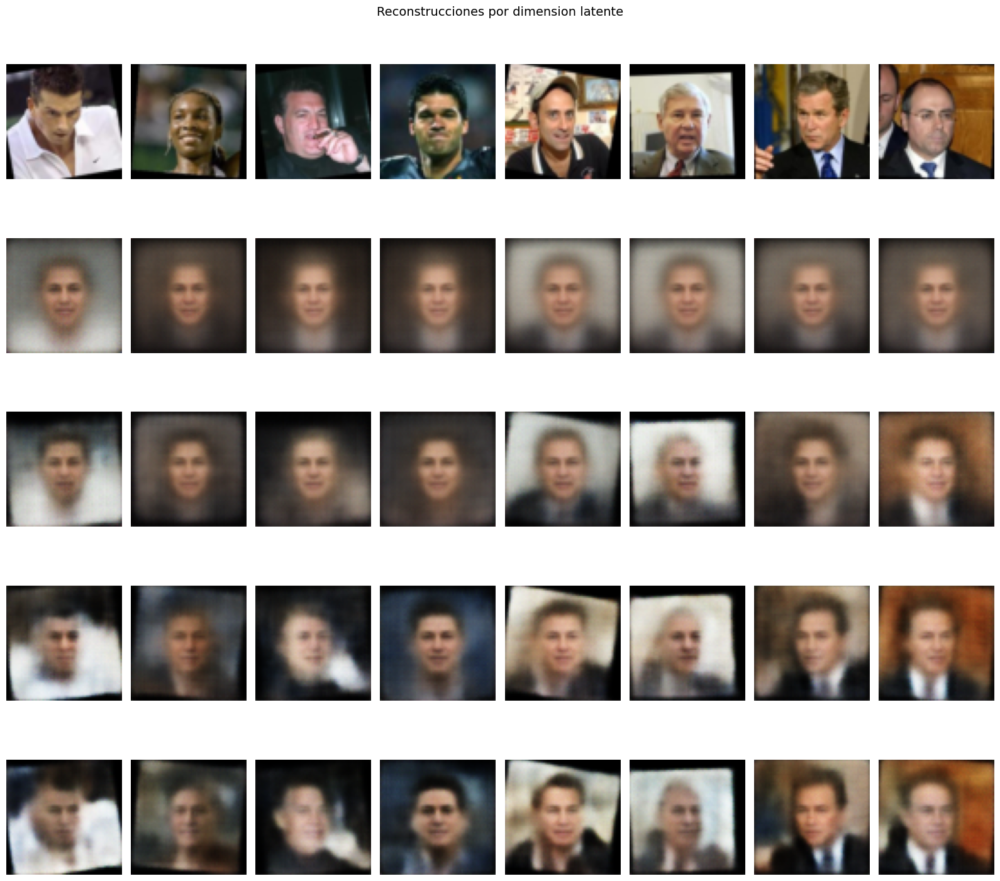

In [20]:
# Comparacion visual de reconstrucciones por dimension latente
x_val, _ = next(iter(val_loader))
x_val = x_val[:8].to(DEVICE)

fig, axes = plt.subplots(len(LATENT_DIMS) + 1, 8,
                         figsize=(16, 3 * (len(LATENT_DIMS) + 1)))

# Fila 0: originales
for i in range(8):
    axes[0, i].imshow(denormalize(x_val[i].cpu()).permute(1, 2, 0).numpy())
    axes[0, i].axis("off")
axes[0, 0].set_ylabel("Original", fontsize=10)

# Filas 1..4: reconstrucciones por modelo
for row, d in enumerate(LATENT_DIMS):
    latent_models[d].eval()
    with torch.no_grad():
        x_hat, _, _ = latent_models[d](x_val)
    x_hat_np = denormalize(x_hat.cpu())
    for i in range(8):
        axes[row + 1, i].imshow(x_hat_np[i].permute(1, 2, 0).numpy().clip(0, 1))
        axes[row + 1, i].axis("off")
    axes[row + 1, 0].set_ylabel(f"$d={d}$", fontsize=10)

plt.suptitle("Reconstrucciones por dimension latente", fontsize=14)
plt.tight_layout(); plt.show()


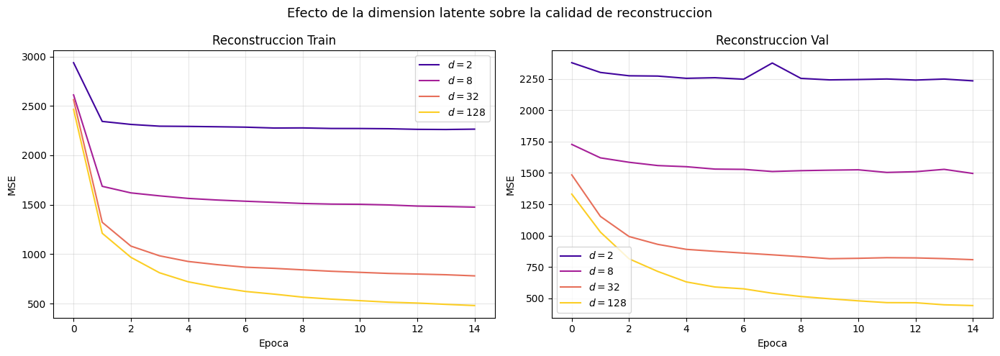

In [21]:
# Curvas de reconstruccion comparadas
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
colors = plt.cm.plasma(np.linspace(0.1, 0.9, len(LATENT_DIMS)))

for d, c in zip(LATENT_DIMS, colors):
    axes[0].plot(latent_histories[d]["recon"],     color=c, label=f"$d={d}$")
    axes[1].plot(latent_histories[d]["val_recon"], color=c, label=f"$d={d}$")

for ax, title in zip(axes, ["Reconstruccion Train", "Reconstruccion Val"]):
    ax.set_xlabel("Epoca"); ax.set_ylabel("MSE")
    ax.set_title(title); ax.legend(); ax.grid(alpha=0.3)

plt.suptitle("Efecto de la dimension latente sobre la calidad de reconstruccion", fontsize=13)
plt.tight_layout(); plt.show()


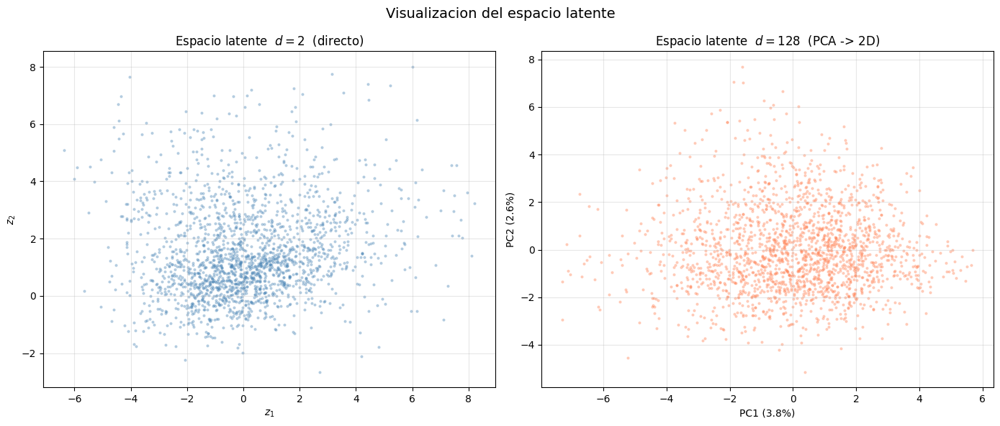

Varianza explicada por PC1+PC2 (d=128): 6.4%


In [22]:
# Visualizacion 2D del espacio latente (d=2 directo, d=128 con PCA)
@torch.no_grad()
def get_mu(model, loader, device, max_batches=15):
    model.eval()
    codes = []
    for i, (x, _) in enumerate(loader):
        if i >= max_batches: break
        mu, _ = model.encode(x.to(device))
        codes.append(mu.cpu())
    return torch.cat(codes, 0).numpy()

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# d=2: plot directo
mu2 = get_mu(latent_models[2], val_loader, DEVICE)
axes[0].scatter(mu2[:, 0], mu2[:, 1], alpha=0.3, s=4, color="steelblue")
axes[0].set_xlabel("$z_1$"); axes[0].set_ylabel("$z_2$")
axes[0].set_title("Espacio latente  $d=2$  (directo)"); axes[0].grid(alpha=0.3)

# d=128 proyectado con PCA
mu128 = get_mu(vae, val_loader, DEVICE)
pca = PCA(n_components=2)
mu_pca = pca.fit_transform(mu128)
axes[1].scatter(mu_pca[:, 0], mu_pca[:, 1], alpha=0.3, s=4, color="coral")
axes[1].set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
axes[1].set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
axes[1].set_title(f"Espacio latente  $d=128$  (PCA -> 2D)"); axes[1].grid(alpha=0.3)

plt.suptitle("Visualizacion del espacio latente", fontsize=14)
plt.tight_layout(); plt.show()
print(f"Varianza explicada por PC1+PC2 (d=128): {pca.explained_variance_ratio_[:2].sum()*100:.1f}%")


---
## Sección C — Interpolación en el Espacio Latente

Tomamos dos caras $x_A$ y $x_B$, las codificamos y luego interpolamos **linealmente**
en el espacio latente:

$$z_A = f_\theta(x_A), \quad z_B = f_\theta(x_B)$$

$$z(\alpha) = (1-\alpha)\,z_A + \alpha\,z_B, \quad \alpha \in [0,\,1]$$

$$\hat{x}(\alpha) = g_\phi\!\left(z(\alpha)\right)$$

Si el espacio latente es **continuo y regular** (gracias al KL), la transición debe
verse suave y semánticamente coherente.


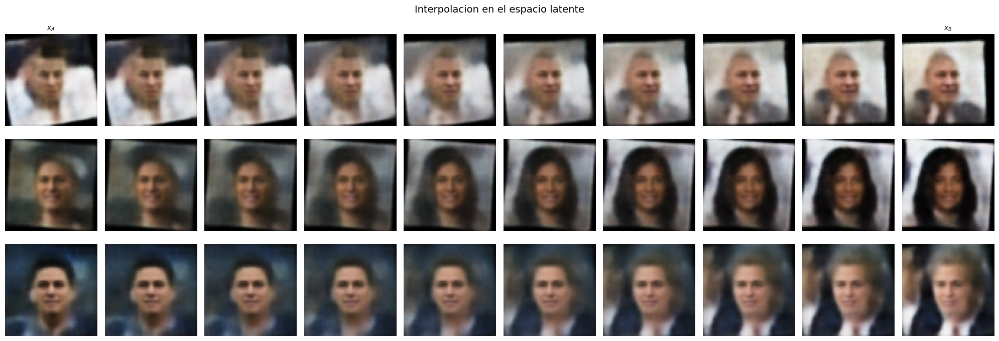

In [23]:
@torch.no_grad()
def interpolate(model, xa, xb, n_steps=10, device=DEVICE):
    """Devuelve una tira de n_steps imagenes interpoladas entre xa y xb."""
    model.eval()
    za, _ = model.encode(xa.unsqueeze(0).to(device))
    zb, _ = model.encode(xb.unsqueeze(0).to(device))
    alphas = torch.linspace(0, 1, n_steps, device=device)
    frames = [denormalize(model.decode((1 - a) * za + a * zb).cpu().squeeze(0))
              for a in alphas]
    return torch.stack(frames)


x_all, _ = next(iter(val_loader))
PAIRS   = [(0, 5), (1, 8), (3, 11)]
N_STEPS = 10

fig, axes = plt.subplots(len(PAIRS), N_STEPS,
                         figsize=(2 * N_STEPS, 2.2 * len(PAIRS) + 0.5))

for row, (ia, ib) in enumerate(PAIRS):
    strip = interpolate(vae, x_all[ia], x_all[ib], n_steps=N_STEPS)
    for col in range(N_STEPS):
        axes[row, col].imshow(strip[col].permute(1, 2, 0).numpy().clip(0, 1))
        axes[row, col].axis("off")
    if row == 0:
        axes[0,           0].set_title("$x_A$",          fontsize=10)
        axes[0, N_STEPS - 1].set_title("$x_B$",          fontsize=10)

plt.suptitle("Interpolacion en el espacio latente", fontsize=14)
plt.tight_layout(); plt.show()


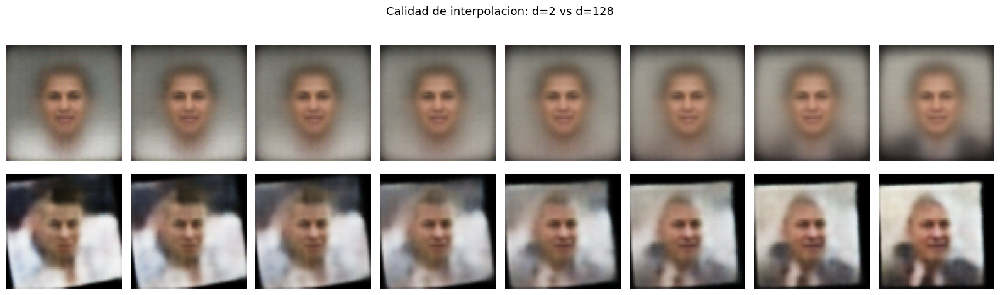

In [24]:
# Comparacion de calidad de interpolacion: d=2 vs d=128
ia, ib = 0, 5
N_COMP = 8

fig, axes = plt.subplots(2, N_COMP, figsize=(2 * N_COMP, 5))
for row, (dim, model_d) in enumerate([(2, latent_models[2]), (LATENT_DIM, vae)]):
    strip = interpolate(model_d, x_all[ia], x_all[ib], n_steps=N_COMP)
    for col in range(N_COMP):
        axes[row, col].imshow(strip[col].permute(1, 2, 0).numpy().clip(0, 1))
        axes[row, col].axis("off")
    axes[row, 0].set_ylabel(f"$d={dim}$", fontsize=12)

plt.suptitle("Calidad de interpolacion: d=2 vs d=128", fontsize=13)
plt.tight_layout(); plt.show()


### 🤔 Preguntas sobre interpolación

1. **¿Es suave la transición?** ¿Hay artefactos o saltos abruptos entre fotogramas?

2. **¿Por qué el espacio latente del VAE permite interpolaciones suaves?**
   A diferencia de un AE estándar, el KL regulariza el espacio latente para que
   regiones contiguas correspondan a imágenes similares.

3. **¿Qué diferencias observás entre $d=2$ y $d=128$?**
   - Con $d=2$: espacio muy comprimido, puede haber distorsión y pérdida de identidad.
   - Con $d=128$: más dimensiones para representar detalles, transiciones más naturales.

4. **¿Qué atributos cambian gradualmente** (pose, iluminación, expresión) **y cuáles no** (identidad)?


---
## Sección D — Autoencoder de Denoising (DAE)

Un **Denoising Autoencoder** aprende a recuperar imágenes limpias a partir de
versiones ruidosas:

$$\tilde{x} = x + \varepsilon, \quad \varepsilon \sim \mathcal{N}(0,\, \sigma_n^2 I)$$

$$\mathcal{L}_{\text{DAE}} = \mathbb{E}\!\left[\,\|\hat{x} - x\|^2\,\right],
\quad \hat{x} = g_\phi\!\left(f_\theta(\tilde{x})\right)$$

La arquitectura es idéntica a la del VAE. Lo único que cambia es que la **entrada
es la imagen ruidosa** $\tilde{x}$ y el **objetivo de reconstrucción es la imagen limpia** $x$.

**¿Por qué funciona?** La red debe distinguir entre "estructura de cara" y "ruido aleatorio",
desarrollando representaciones más robustas.

**Aplicaciones prácticas**
- Restauración de imágenes médicas (rayos X, resonancias)
- Denoising fotográfico en condiciones de poca luz
- Pre-procesamiento para otras tareas de visión

> **Conexión con modelos de difusión:** Los DDPM llevan esta idea al extremo,
> entrenando un denoiser para múltiples niveles de ruido simultáneamente.


In [25]:
NOISE_STD  = 0.3
EPOCHS_DAE = 3 if QUICK_MODE else 20

def add_noise(x, std=NOISE_STD):
    return (x + torch.randn_like(x) * std).clamp(-1, 1)


def train_epoch_dae(model, loader, optimizer, noise_std, device):
    model.train()
    total = 0.0
    for x, _ in loader:
        x        = x.to(device)
        x_noisy  = add_noise(x, noise_std)
        x_hat, mu, log_var = model(x_noisy)
        loss, recon, _ = vae_loss(x_hat, x, mu, log_var, beta=1.0)
        optimizer.zero_grad(); loss.backward(); optimizer.step()
        total += recon.item() * x.size(0)
    return total / len(loader.dataset)


dae     = ConvVAE(latent_dim=128).to(DEVICE)
opt_dae = optim.Adam(dae.parameters(), lr=1e-3)
history_dae = []

print("Entrenando Denoising Autoencoder...")
for epoch in range(1, EPOCHS_DAE + 1):
    r = train_epoch_dae(dae, train_loader, opt_dae, NOISE_STD, DEVICE)
    history_dae.append(r)
    if epoch % 5 == 0 or epoch == 1:
        print(f"  Epoca {epoch:2d}/{EPOCHS_DAE}  Recon vs limpia: {r:.4f}")
print("DAE entrenado.")


Entrenando Denoising Autoencoder...
  Epoca  1/20  Recon vs limpia: 2065.9897
  Epoca  5/20  Recon vs limpia: 641.3337
  Epoca 10/20  Recon vs limpia: 503.6788
  Epoca 15/20  Recon vs limpia: 458.4457
  Epoca 20/20  Recon vs limpia: 433.4692
DAE entrenado.


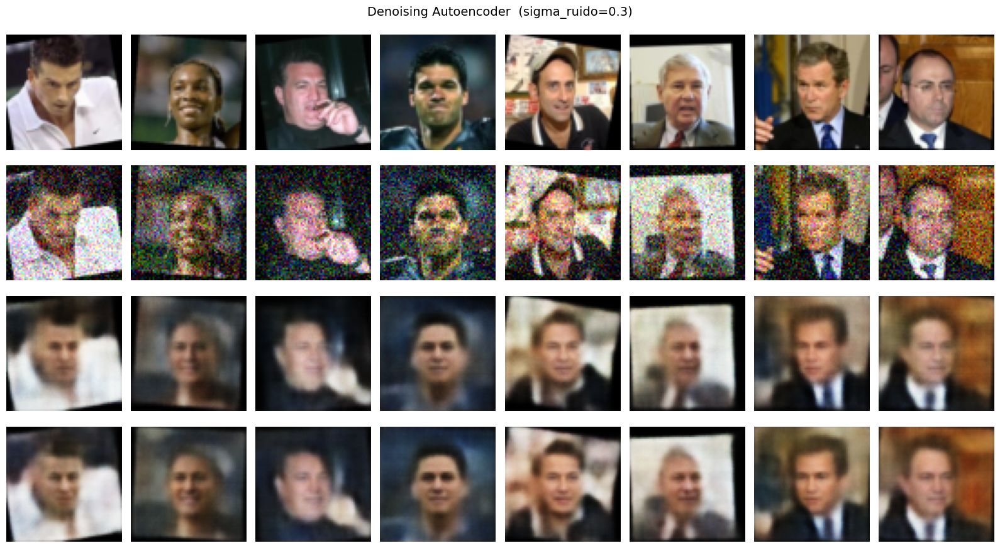

In [26]:
@torch.no_grad()
def show_denoising(model_dae, model_vae, loader, noise_std, n=8, device=DEVICE):
    """Muestra: original | ruidosa | DAE | VAE estandar sobre entrada ruidosa."""
    model_dae.eval(); model_vae.eval()
    x, _ = next(iter(loader))
    x = x[:n].to(device)
    x_noisy = add_noise(x, noise_std)

    xhat_dae, _, _ = model_dae(x_noisy)
    xhat_vae, _, _ = model_vae(x_noisy)

    rows    = ["Original  $x$", "Ruidosa  $\\tilde{x}$",
               "DAE  $\\hat{x}$", "VAE estandar  $\\hat{x}$"]
    batches = [x, x_noisy, xhat_dae, xhat_vae]

    fig, axes = plt.subplots(4, n, figsize=(2 * n, 9))
    for r, (label, batch) in enumerate(zip(rows, batches)):
        batch = denormalize(batch.cpu())
        for c in range(n):
            axes[r, c].imshow(batch[c].permute(1, 2, 0).numpy().clip(0, 1))
            axes[r, c].axis("off")
        axes[r, 0].set_ylabel(label, fontsize=10)
    plt.suptitle(f"Denoising Autoencoder  (sigma_ruido={noise_std})", fontsize=14)
    plt.tight_layout(); plt.show()


show_denoising(dae, vae, val_loader, NOISE_STD, n=8)


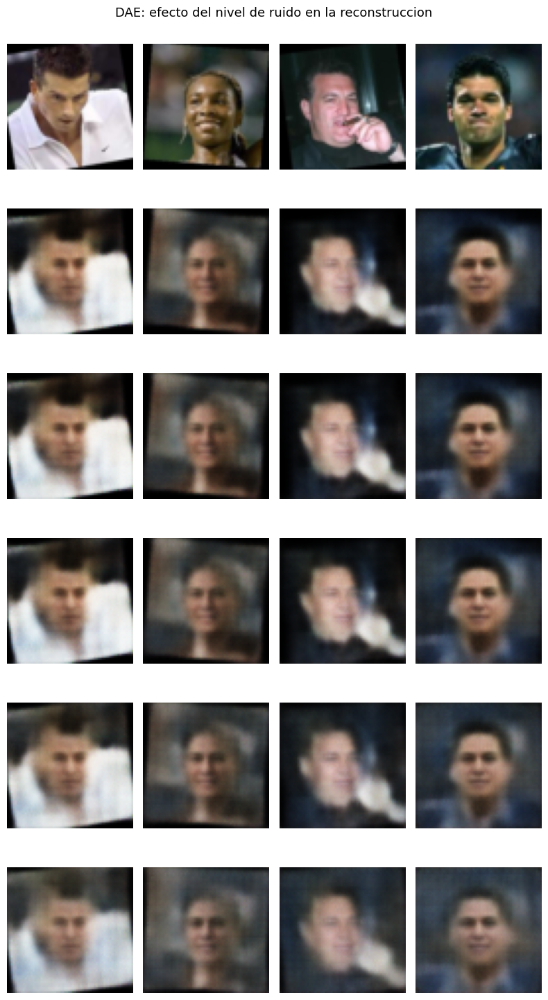

In [27]:
# Experimento: distintos niveles de ruido
noise_levels = [0.1, 0.2, 0.3, 0.5, 0.8]
x_orig, _   = next(iter(val_loader))
x_orig = x_orig[:4].to(DEVICE)

fig, axes = plt.subplots(len(noise_levels) + 1, 4,
                         figsize=(8, 2.5 * (len(noise_levels) + 1)))

for i in range(4):
    axes[0, i].imshow(denormalize(x_orig[i].cpu()).permute(1, 2, 0).numpy())
    axes[0, i].axis("off")
axes[0, 0].set_ylabel("Original", fontsize=9)

for row, ns in enumerate(noise_levels):
    x_noisy = add_noise(x_orig, ns)
    dae.eval()
    with torch.no_grad():
        x_hat, _, _ = dae(x_noisy)
    x_hat = denormalize(x_hat.cpu())
    for i in range(4):
        axes[row + 1, i].imshow(x_hat[i].permute(1, 2, 0).numpy().clip(0, 1))
        axes[row + 1, i].axis("off")
    axes[row + 1, 0].set_ylabel(f"sigma={ns}", fontsize=9)

plt.suptitle("DAE: efecto del nivel de ruido en la reconstruccion", fontsize=13)
plt.tight_layout(); plt.show()


### 🤔 Análisis del denoising

1. **¿El DAE elimina el ruido mejor que el VAE estándar?** ¿Por qué tiene sentido?

2. **¿Hay un trade-off entre denoising y nitidez?** Un modelo que "desnormaliza demasiado"
   puede eliminar detalles reales junto con el ruido.

3. **¿A partir de qué $\sigma$ el DAE ya no puede recuperar la imagen?**

4. **Conexión con difusión:** Los DDPM entrenan un denoiser para todo el espectro
   $\sigma \in [\sigma_{\min}, \sigma_{\max}]$. ¿Podés imaginar cómo extender este
   notebook hacia ese esquema?


---
## Sección E — Detección de Anomalías

Los autoencoders pueden detectar anomalías usando el **error de reconstrucción**
como puntuación de anomalía:

$$\text{score}(x) = \|x - \hat{x}\|^2$$

| Tipo de imagen | Predicción | Fundamento |
|----------------|-----------|------------|
| Inliers (vistas en entrenamiento) | score **bajo** | el modelo aprendió a reconstruirlas |
| Outliers (fuera de distribución) | score **alto** | el modelo falla al reconstruirlas |

### Protocolo

1. Entrenamos el VAE solo sobre imágenes de **personas con muchas fotos** en LFW (≥ 5 imágenes).
2. Evaluamos el error de reconstrucción sobre ese subconjunto **y** sobre personas con pocas fotos.
3. Verificamos si el error discrimina entre las dos clases.

La lógica: el modelo aprende a reconstruir bien las caras de personas que aparecen frecuentemente,
y falla más con caras de personas muy distintas o poco representadas.


In [28]:
# Separar inliers y outliers usando identidad de persona en LFW
#
# full_dataset.targets[i] = clase (persona) de la imagen i en el dataset completo
# val_dataset_full.indices = posiciones dentro de full_dataset que cayeron en val
#
# Buscamos indices dentro de val_dataset_full (0-based) que correspondan a
# personas comunes (>= 5 fotos) vs raras (< 5 fotos).

all_targets = np.array(full_dataset.targets)
counts      = np.bincount(all_targets, minlength=len(full_dataset.classes))

common_cls = np.where(counts >= 5)[0]
rare_cls   = np.where((counts > 0) & (counts < 5))[0]

# Targets de cada muestra dentro de val_dataset_full
val_indices = np.array(val_dataset_full.indices)       # posiciones en full_dataset
val_targets = all_targets[val_indices]                 # clase de cada muestra de val

# Indices dentro de val_dataset_full
smiling_idx     = np.where(np.isin(val_targets, common_cls))[0][:600].tolist()
not_smiling_idx = np.where(np.isin(val_targets, rare_cls  ))[0][:600].tolist()

INLIER_LABEL  = "personas frecuentes (>= 5 fotos)"
OUTLIER_LABEL = "personas raras (< 5 fotos)"

print(f"Personas con >= 5 fotos (clases comunes): {len(common_cls):,}")
print(f"Personas con  < 5 fotos (clases raras):   {len(rare_cls):,}")
print(f"Inliers  en val ({INLIER_LABEL}):  {len(smiling_idx)}")
print(f"Outliers en val ({OUTLIER_LABEL}): {len(not_smiling_idx)}")


Personas con >= 5 fotos (clases comunes): 423
Personas con  < 5 fotos (clases raras):   5,326
Inliers  en val (personas frecuentes (>= 5 fotos)):  600
Outliers en val (personas raras (< 5 fotos)): 600


In [29]:
# Entrenar VAE solo sobre inliers (personas frecuentes)
EPOCHS_ANOM = 3 if QUICK_MODE else 25

inlier_train_ds = Subset(val_dataset_full, smiling_idx[:400])
inlier_train_ld = DataLoader(inlier_train_ds, batch_size=64, shuffle=True, num_workers=2)

vae_anom = ConvVAE(latent_dim=64).to(DEVICE)
opt_anom = optim.Adam(vae_anom.parameters(), lr=1e-3)

print(f"Entrenando VAE sobre inliers: {INLIER_LABEL}")
for epoch in range(1, EPOCHS_ANOM + 1):
    tr = train_epoch(vae_anom, inlier_train_ld, opt_anom, 1.0, DEVICE)
    if epoch % 5 == 0 or epoch == EPOCHS_ANOM:
        print(f"  Epoca {epoch:2d}/{EPOCHS_ANOM}  Recon: {tr[1]:.4f}")
print("Listo.")


Entrenando VAE sobre inliers: personas frecuentes (>= 5 fotos)
  Epoca  5/25  Recon: 2002.0937
  Epoca 10/25  Recon: 1465.7587
  Epoca 15/25  Recon: 1190.6946
  Epoca 20/25  Recon: 932.0030
  Epoca 25/25  Recon: 811.8389
Listo.


In [30]:
# Calcular error de reconstruccion para inliers y outliers
@torch.no_grad()
def recon_errors(model, dataset, device, bs=64):
    model.eval()
    loader = DataLoader(dataset, batch_size=bs, shuffle=False)
    errs   = []
    for x, _ in loader:
        x        = x.to(device)
        x_hat, _, _ = model(x)
        err      = F.mse_loss(x_hat, x, reduction="none").mean(dim=[1, 2, 3])
        errs.extend(err.cpu().numpy())
    return np.array(errs)


inlier_test_ds  = Subset(val_dataset_full, smiling_idx[400:])
outlier_test_ds = Subset(val_dataset_full, not_smiling_idx)

err_in  = recon_errors(vae_anom, inlier_test_ds,  DEVICE)
err_out = recon_errors(vae_anom, outlier_test_ds, DEVICE)

print(f"Error medio inliers  ({INLIER_LABEL}):  {err_in.mean():.4f} +- {err_in.std():.4f}")
print(f"Error medio outliers ({OUTLIER_LABEL}): {err_out.mean():.4f} +- {err_out.std():.4f}")


Error medio inliers  (personas frecuentes (>= 5 fotos)):  0.0885 +- 0.0288
Error medio outliers (personas raras (< 5 fotos)): 0.0925 +- 0.0310


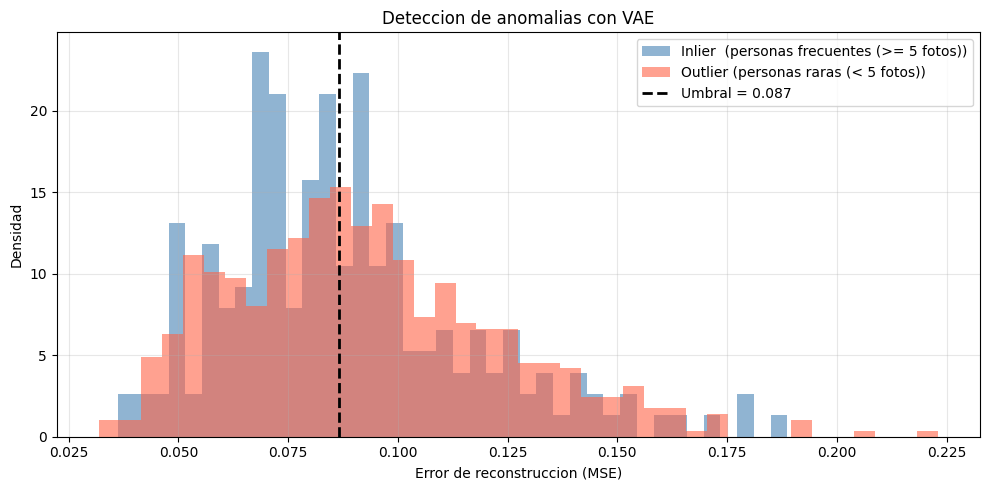

AUC-ROC = 0.541  (0.5 = azar,  1.0 = perfecto)


In [31]:
# Histograma de errores y AUC-ROC
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(err_in,  bins=40, alpha=0.6, color="steelblue", density=True,
        label=f"Inlier  ({INLIER_LABEL})")
ax.hist(err_out, bins=40, alpha=0.6, color="tomato",    density=True,
        label=f"Outlier ({OUTLIER_LABEL})")

threshold = (np.median(err_in) + np.median(err_out)) / 2
ax.axvline(threshold, color="black", linestyle="--", linewidth=2,
           label=f"Umbral = {threshold:.3f}")

ax.set_xlabel("Error de reconstruccion (MSE)")
ax.set_ylabel("Densidad")
ax.set_title("Deteccion de anomalias con VAE")
ax.legend(); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

y_true  = np.concatenate([np.zeros(len(err_in)), np.ones(len(err_out))])
y_score = np.concatenate([err_in, err_out])
auc     = roc_auc_score(y_true, y_score)
print(f"AUC-ROC = {auc:.3f}  (0.5 = azar,  1.0 = perfecto)")


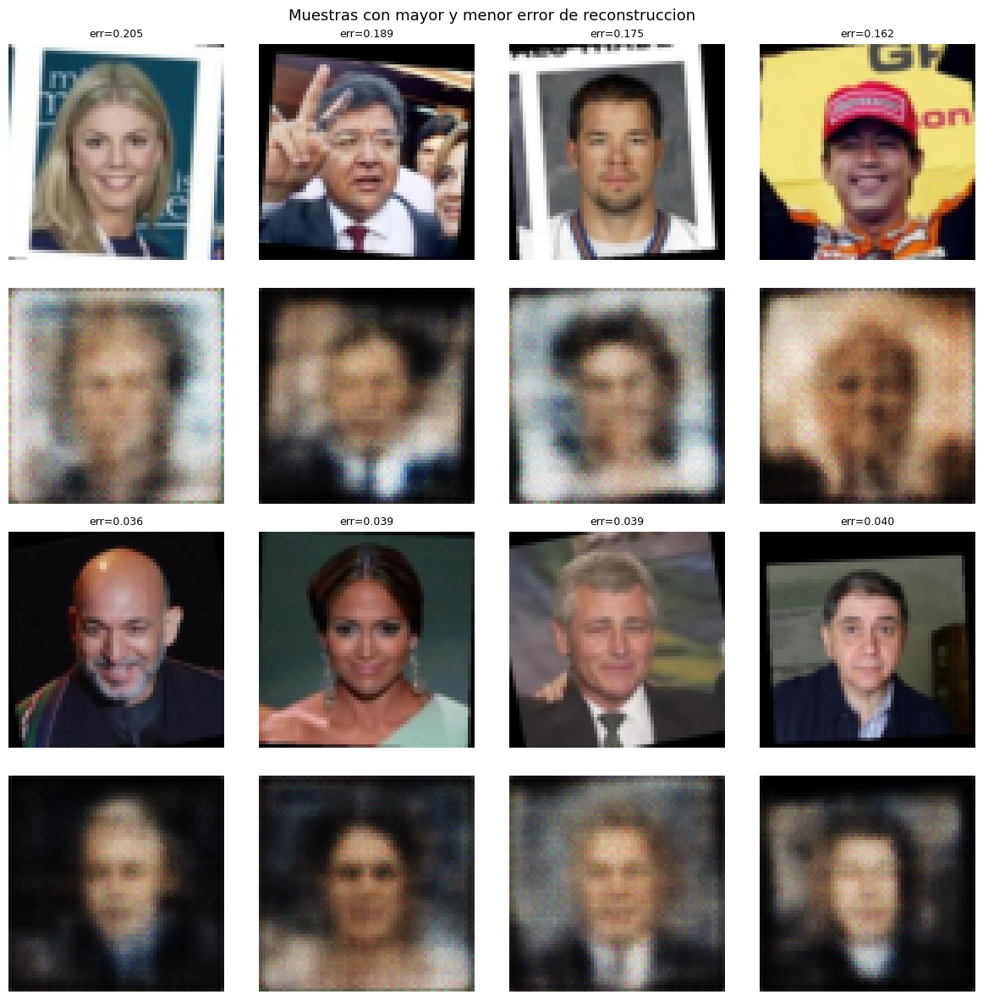

In [33]:
# Imagenes con mayor y menor error de reconstruccion
@torch.no_grad()
def extreme_samples(model, dataset, device, n=4, highest=True):
    loader = DataLoader(dataset, batch_size=min(len(dataset), 256), shuffle=False)
    x_all, _ = next(iter(loader))
    x_all    = x_all.to(device)
    x_hat, _, _ = model(x_all)
    err  = F.mse_loss(x_hat, x_all, reduction="none").mean(dim=[1, 2, 3]).cpu().numpy()
    idx  = np.argsort(err)[-n:][::-1] if highest else np.argsort(err)[:n]
    return x_all[idx].cpu(), x_hat[idx].cpu(), err[idx]


combined_ds = Subset(val_dataset_full,
    (smiling_idx[400:500] + not_smiling_idx[:100])[:min(200, len(val_dataset_full))])
# Fix: avoid negative-stride numpy indices when selecting highest errors
@torch.no_grad()
def extreme_samples(model, dataset, device, n=4, highest=True):
    loader = DataLoader(dataset, batch_size=min(len(dataset), 256), shuffle=False)
    x_all, _ = next(iter(loader))
    x_all = x_all.to(device)
    x_hat, _, _ = model(x_all)

    err = F.mse_loss(x_hat, x_all, reduction="none").mean(dim=[1, 2, 3]).cpu().numpy()
    idx = np.argsort(err)
    idx = idx[-n:][::-1].copy() if highest else idx[:n].copy()  # <- copy removes negative stride

    return x_all[idx].cpu(), x_hat[idx].cpu(), err[idx]

x_hi, xhat_hi, e_hi = extreme_samples(vae_anom, combined_ds, DEVICE, n=4, highest=True)
x_lo, xhat_lo, e_lo = extreme_samples(vae_anom, combined_ds, DEVICE, n=4, highest=False)

fig, axes = plt.subplots(4, 4, figsize=(12, 12))
for col in range(4):
    axes[0, col].imshow(denormalize(x_hi[col]).permute(1, 2, 0).numpy().clip(0, 1))
    axes[0, col].set_title(f"err={e_hi[col]:.3f}", fontsize=9)
    axes[1, col].imshow(denormalize(xhat_hi[col]).permute(1, 2, 0).numpy().clip(0, 1))
    axes[2, col].imshow(denormalize(x_lo[col]).permute(1, 2, 0).numpy().clip(0, 1))
    axes[2, col].set_title(f"err={e_lo[col]:.3f}", fontsize=9)
    axes[3, col].imshow(denormalize(xhat_lo[col]).permute(1, 2, 0).numpy().clip(0, 1))
    for r in range(4): axes[r, col].axis("off")

axes[0, 0].set_ylabel("Original\n(error alto)",  fontsize=9)
axes[1, 0].set_ylabel("Recon.\n(error alto)",    fontsize=9)
axes[2, 0].set_ylabel("Original\n(error bajo)",  fontsize=9)
axes[3, 0].set_ylabel("Recon.\n(error bajo)",    fontsize=9)
plt.suptitle("Muestras con mayor y menor error de reconstruccion", fontsize=13)
plt.tight_layout(); plt.show()


### 🤔 Preguntas sobre detección de anomalías

1. **¿Los histogramas se separan?** Si AUC > 0.7, el VAE discrimina bien. ¿Qué pasa si AUC ≈ 0.5?

2. **¿Por qué los errores se solapan?** Las caras de ambas clases comparten la misma
   estructura facial básica. ¿Qué tipo de outlier daría mejor separación?

3. **¿Qué pasa si entrenás con una sola persona?**
   Probá cambiando el conjunto de entrenamiento para que sea más específico.

4. **¿El umbral óptimo depende del contexto?**
   - En diagnóstico médico: mejor minimizar falsos negativos (no perder anomalías).
   - En producción: mejor minimizar falsos positivos (no alarmar innecesariamente).

5. **Aplicaciones reales:**
   - Detección de fraude (transacciones inusuales)
   - Control de calidad industrial (defectos en piezas)
   - Monitoreo de servidores (comportamiento anómalo)
   - Diagnóstico médico (lesiones atípicas)


---
## Resumen

| Sección | Concepto clave | Observación principal |
|---------|----------------|----------------------|
| A — Reconstrucción | El VAE comprime y descomprime | Imágenes borrosas pero reconocibles |
| B — Dimensión latente | Trade-off compresión / calidad | Mayor $d$ → mejor reconstrucción, peor compresión |
| C — Interpolación | El KL hace el espacio continuo | Transiciones suaves en el espacio latente |
| D — Denoising | DAE: entrada ruidosa → salida limpia | El DAE supera al VAE estándar en denoising |
| E — Anomalías | Error de reconstrucción como score | Funciona si inliers y outliers son suficientemente distintos |

---

## Conexión con otros modelos generativos

```
VAE                         GAN                         Difusion (DDPM)
Encoder + Decoder           Generador + Discriminador   Cadena de denoising (U-Net)
ELBO (recon + KL)           Adversarial loss            Denoising score matching
Espacio latente regular     Sin espacio latente fijo    Sin espacio latente explicito
Imagenes suaves/borrosas    Imagenes muy nitidas        Imagenes muy nitidas
Interpolacion suave         Interpolacion posible       Guiado por texto posible
```

## Proximos pasos

- **beta-VAE**: aumentar $\beta$ para obtener representaciones *disentangled*
  (cada dimension controla un atributo independiente).
- **VQ-VAE**: espacio latente **discreto** — base de DALL-E 1 y MusicGen.
- **Stable Diffusion**: combina un VAE (compresion 8x) con un modelo de difusion
  (generacion en el espacio comprimido).
